Лабораторная работа №1. Компьютерное зрение

1. Подключаем важные библиотеки, для работы с изображениями и фильтрами.

In [1]:
from scipy import ndimage
import matplotlib.pyplot as plt
import imageio
import PIL
import numpy as np
import cv2
import skimage

2. Можно сохранять фото в проект по следующему коду:

In [2]:
!curl -o "merin.jpg" "https://i.pinimg.com/736x/b2/ce/ba/b2ceba25b5f9b1932d492fe7cf34564d.jpg"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
 24  132k   24 33072    0     0   108k      0  0:00:01 --:--:--  0:00:01  109k
100  132k  100  132k    0     0   295k      0 --:--:-- --:--:-- --:--:--  297k


3. OpenCV — чрезвычайно популярная библиотека компьютерного зрения, написанная на C++, с множеством мощных инструментов для CV. Она позволяет читать, записывать и показывать изображения и видео, читать потоки веб-камеры, находить совпадающие ключевые точки между двумя изображениями и многое другое.

подключаем библиотеку cv2

In [3]:
import cv2

в переменную image читаем изображение - это будет тензор или вектор.

In [4]:
image = cv2.imread("merin.jpg")

type - вид фото

In [5]:
type(image)

numpy.ndarray

shape - размерность

In [6]:
image.shape

(900, 720, 3)

In [7]:
image.dtype

dtype('uint8')

In [8]:
image[0,0]

array([122, 101,  69], dtype=uint8)

In [9]:
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    from google.colab.patches import cv2_imshow
else:
    print('Not running on CoLab')
    def cv2_imshow(img):
        cv2.imshow('image', img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()


cv2_imshow(image)

Not running on CoLab


In [10]:
R,G,B = image[:,:,0], image[:,:,1], image[:,:,2]

cv2_imshow(R)
cv2_imshow(G)
cv2_imshow(B)

cv2_imshow(np.concatenate((R,G,B),axis = 1))

In [11]:
empty_arr = np.zeros(G.shape, dtype=np.uint8)

# Складываем каналы, получаем новый 3 канал
manipulated_image = np.stack([ R, empty_arr, B, ], axis=2)
print("Created image of shape",manipulated_image.shape)
cv2_imshow(manipulated_image)

Created image of shape (900, 720, 3)


In [12]:
import os
output_path = os.path.join("output.png")
cv2.imwrite(output_path, manipulated_image)

True

In [13]:
test_read_output = cv2.imread(output_path)
print(f'Read file: shape {test_read_output.shape}, type {test_read_output.dtype}')
cv2_imshow(test_read_output)

Read file: shape (900, 720, 3), type uint8


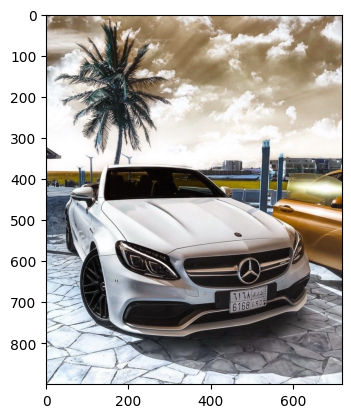

In [14]:
plt.imshow(image)
plt.show()

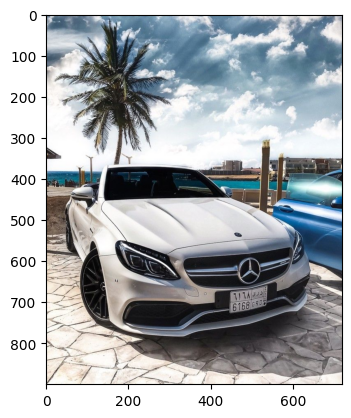

In [15]:
image_rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()

In [16]:
def imshow(image, *args, **kwargs):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    else:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    plt.imshow(image, *args, **kwargs )
    plt.axis('off')
    plt.show()
    

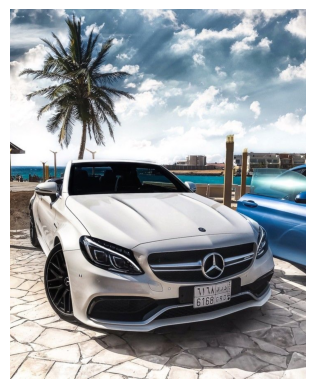

In [17]:
imshow(image)

(900, 720, 3)


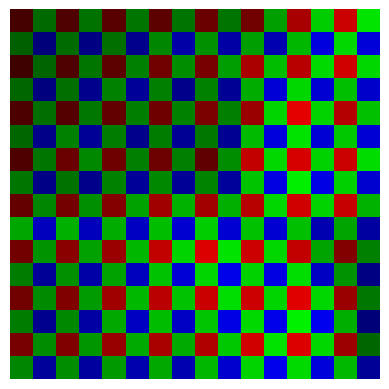

In [18]:
#
print(image.shape)
red_mask = np.zeros(shape=image.shape[0:2],dtype=bool)
green_mask, blue_mask = red_mask.copy(), red_mask.copy()
red_mask[0::2,0::2] = True
blue_mask[1::2,1::2] = True
green_mask[0::2,1::2] = True
green_mask[1::2,0::2] = True

# display red
rsize = np.ceil(np.asarray(red_mask.shape)/2.0).astype(int)
reds = image[:,:,2][red_mask].reshape(rsize)
#cv2_imshow(reds)

# display blue
bsize = np.floor(np.asarray(blue_mask.shape)/2.0).astype(int)
blues = image[:,:,0][blue_mask].reshape(bsize)
#cv2_imshow(blues)

# construct a Bayer image:
bayer = np.zeros(shape=(*image.shape[0:2],3),dtype=image.dtype)
# assing colors (BGR)
bayer[:,:,0][blue_mask]  = blues.flatten() # B
bayer[:,:,2][red_mask]   = reds.flatten() # R
bayer[:,:,1][green_mask] = image[:,:,1][green_mask] # Green
imshow(bayer[:16,:16]) # show zoomed in
cv2_imshow(bayer)

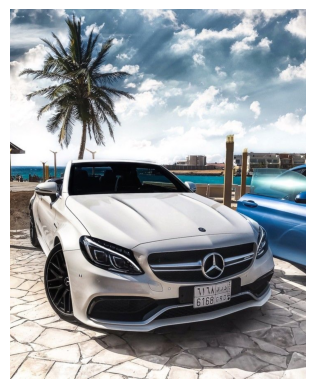

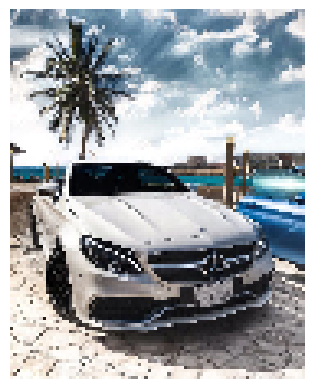

In [19]:
def downsample( img ):
    return img[0::2,0::2]

half = downsample(image)    # 1/2 resolution
quad = downsample(half)     # 1/4
eighth = downsample(quad)   # 1/8
imshow(image)
#imshow(half)
#imshow(quad)
imshow(eighth)

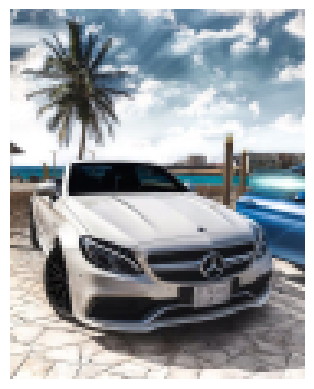

In [20]:
smooth = cv2.resize(image, eighth.shape[1::-1], interpolation=cv2.INTER_AREA)
imshow(smooth)

Упражнение №1. 
Оттенки серого: Цвет хорош, но монохромные изображения также очень привлекательны. Отображение одного цветового канала выглядит не очень хорошо. Поэтому нам нужна взвешенная сумма всех каналов. Типичные веса для преобразования из RGB в оттенки серого:

0,2989∗R+0,5870∗G+0,1140∗B

(a) Загрузите изображение gogh.jpg. Преобразуйте его в оттенки серого и отобразите. Не забывайте, что каналы — это BGR.

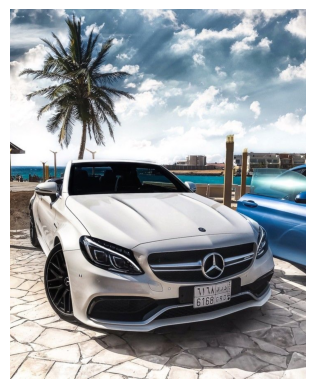

In [21]:
# Упражнение №1

image = cv2.imread("merin.jpg")
imshow(image)

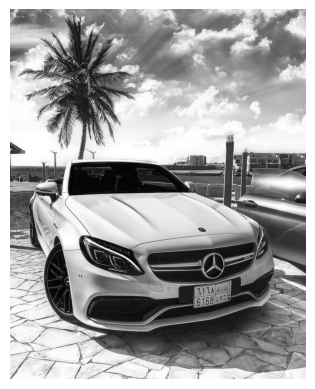

In [22]:
B,G,R = image[:,:,0],image[:,:,1],image[:,:,2]
gray_image = np.round(0.2989*R+0.5870*G+0.1140*B)
gray_image = gray_image.astype("uint8")
imshow(gray_image)

Упражнение 2. 

Гамма-кривая: 8-битные изображения хранятся нелинейно (как наше восприятие). Обычной функцией, используемой для этого нелинейного линейного отображения, является гамма-кривая:  y=xγ , где x — линейные значения в диапазоне [0,1]. Гамма равна  γ=2.2  в большинстве систем.

(a) Линеаризуйте изображение и отобразите его. Обратите внимание, что отображение линейного изображения может выглядеть странно.

(b) Примените разные γ (например, 0,5, 1,0 и 1,5) и посмотрите, что происходит.

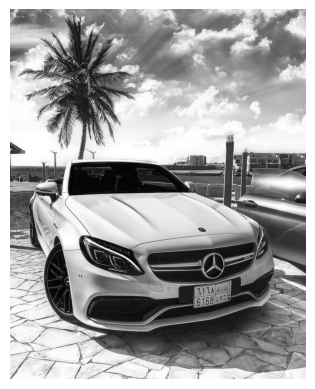

gamma = 0.5


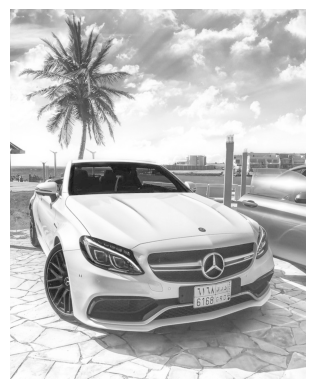

gamma = 1.0


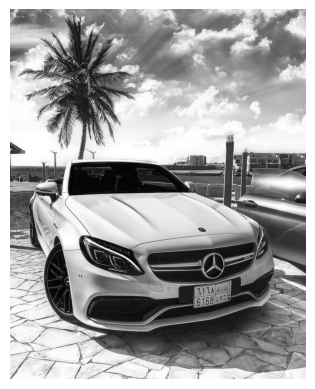

gamma = 1.5


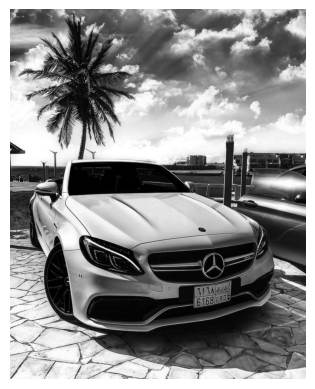

gamma = 2.0


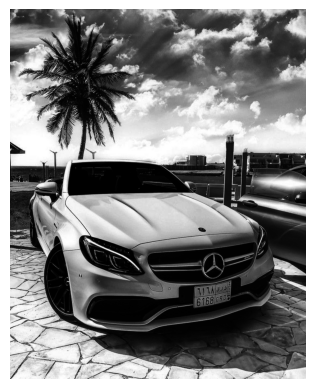

gamma = 2.1


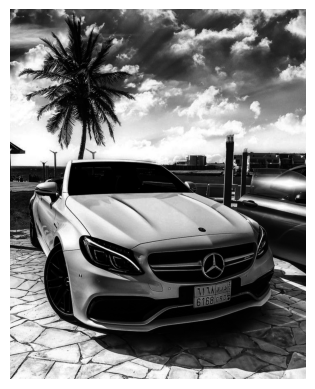

gamma = 2.2


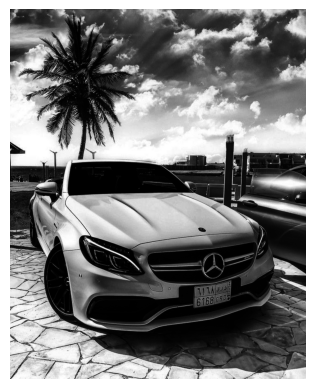

gamma = 2.5


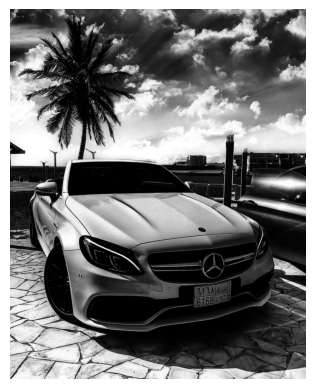

gamma = 10.0


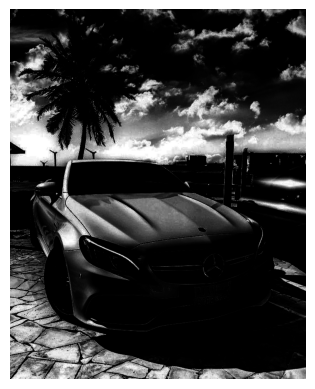

In [23]:
# Упражнение №2.
image = cv2.imread("merin.jpg")

B,G,R = image[:,:,0],image[:,:,1],image[:,:,2]
gray_image = np.round(0.2989*R+0.5870*G+0.1140*B)/255
gray_image = gray_image.astype("float32")
imshow(gray_image)

for gamma in [0.5,1.0,1.5,2.0,2.1,2.2,2.5,10.0]:
    print(f'gamma = {gamma}')
    gray_2_2 = gray_image ** gamma
    imshow(gray_2_2)

In [24]:
import os
# сохраняем изображение

output_path = os.path.join("merin.png")
cv2.imwrite(output_path, gray_2_2 * 255)

True

In [25]:
filename = "merin.jpg"

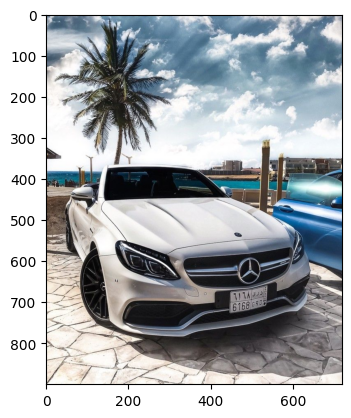

In [26]:
pic = PIL.Image.open(filename)
sigma = 10
pix = np.array(pic)
result = ndimage.gaussian_filter(pix, sigma)
PIL_image = PIL.Image.fromarray(np.uint8(result)).convert('L')
PIL_image.save("merin_gauss.jpg")
plt.imshow(pic)


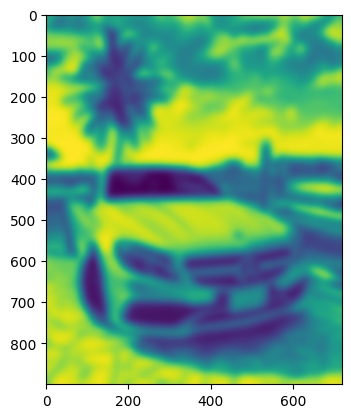

In [27]:
plt.imshow(PIL_image)

('R', 'G', 'B')
('L',)


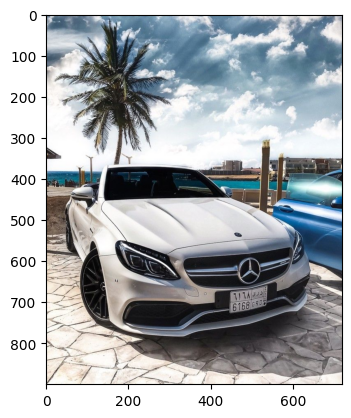

In [28]:
roberts_cross_v = np.array([[1, 0 ],
                            [0,-1 ]])
roberts_cross_h = np.array([[ 0, 1 ],
                            [ -1, 0 ]])
#pix = cv2.imread("1.dicom.jpeg", 0).astype('float64')


with PIL.Image.open(filename) as pix:
    pix.load()

plt.imshow(pix)
b = pix.getbands()  # проверяем, сколько слоев в изображении
print(b)

# преобразуем в серое
pix = pix.convert("L")

b = pix.getbands()  # проверяем, сколько слоев в изображении
print(b)

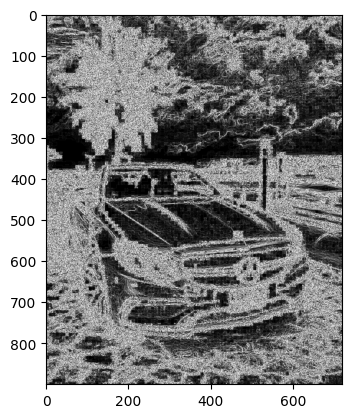

In [29]:
vertical = ndimage.convolve(pix, roberts_cross_v)
horizontal = ndimage.convolve(pix, roberts_cross_h)
edged_img = np.sqrt( np.square(horizontal) + np.square(vertical))


PIL_image = PIL.Image.fromarray(np.uint8(edged_img))

plt.imshow(PIL_image,cmap=plt.cm.gray)
PIL_image.save("merin_test_roberts.jpg")

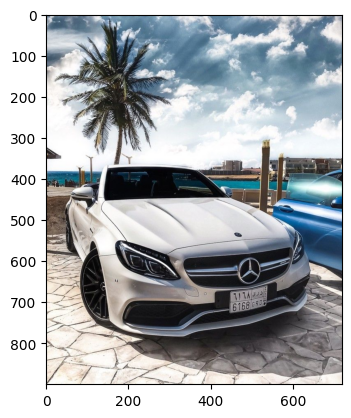

In [30]:
pic = PIL.Image.open(filename)
pix = np.array(pic)
input_shape = pix.shape
new_shape = input_shape[1], input_shape[0]
result = skimage.filters.prewitt(pix)

# первоначальное изображение
plt.imshow(pic, cmap=plt.cm.gray, aspect='equal')

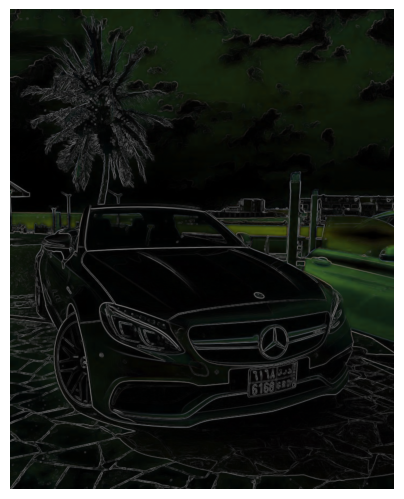

In [31]:
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)

#измененное изображение
plt.imshow(result, cmap=plt.cm.gray, aspect='equal')


plt.savefig("prewitt_test.jpg", dpi=300)

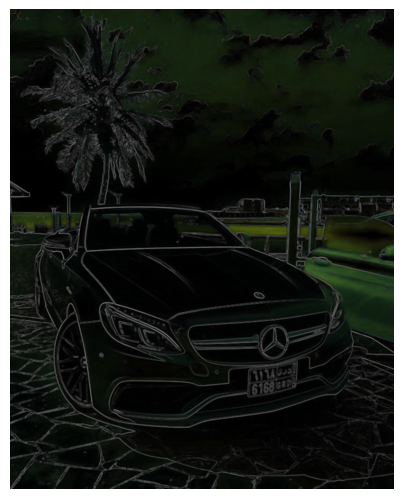

In [32]:
pic = PIL.Image.open(filename)
pix = np.array(pic)
input_shape = pix.shape
new_shape = input_shape[1], input_shape[0]
result = skimage.filters.sobel(pix)
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(result, cmap=plt.cm.gray, aspect='equal', interpolation="mitchell")
plt.savefig("merin_sobel_test.jpg", dpi=300)

In [33]:
def LoG_filter(image, sigma, size=None):
    # ядро LoG
    if size is None:
        size = int(6 * sigma + 1) if sigma >= 1 else 7

    if size % 2 == 0:
        size += 1

    x, y = np.meshgrid(np.arange(-size//2+1, size//2+1), np.arange(- size // 2 + 1, size // 2 + 1))
    kernel = -(1/(np.pi * sigma**4)) * (1 - ((x**2 + y**2) / (2 * sigma**2))) * np.exp(- (x**2 + y**2) / (2 * sigma**2))
    kernel = kernel / np.sum(np.abs(kernel))

    result = ndimage.convolve(image, kernel)
    return result

image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
sigma = 2.0
filtered_image = LoG_filter(image, sigma)

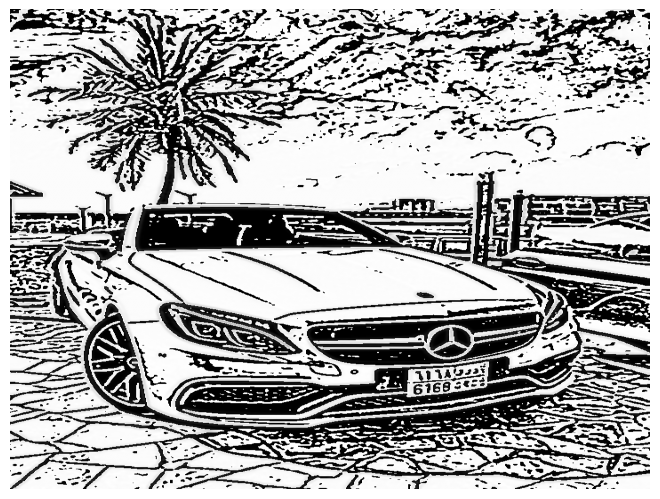

In [34]:
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(filtered_image, cmap=plt.cm.gray, aspect='auto')
plt.savefig("merin_log_test.jpg", dpi=300)

In [35]:
from sklearn.cluster import MeanShift, estimate_bandwidth

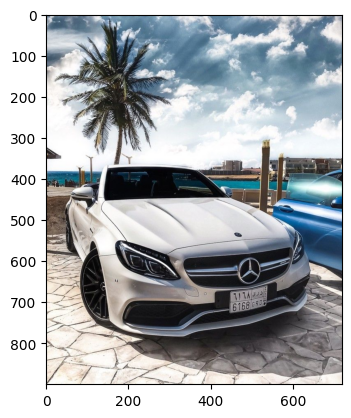

In [36]:
image = PIL.Image.open(filename).convert('RGB')

plt.imshow(image, cmap=plt.cm.gray, aspect='equal')


img = np.array(image)
shape = img.shape
new_shape = shape[1], shape[0]
reshaped_image = np.reshape(image, [-1, 3])
bandwidth = estimate_bandwidth(reshaped_image, quantile=0.1, n_samples=300)

msc = MeanShift(bandwidth=bandwidth, bin_seeding=True)
msc.fit(reshaped_image)

labels = msc.labels_
result_image = np.reshape(labels, shape[:2])

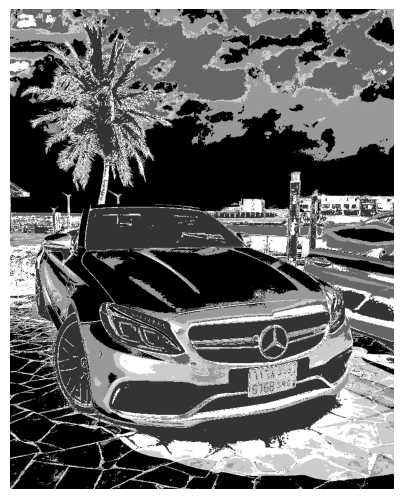

In [38]:
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)

plt.imshow(result_image, cmap=plt.cm.gray, aspect='equal')
plt.savefig("merin_test_axes.jpg", dpi=300)

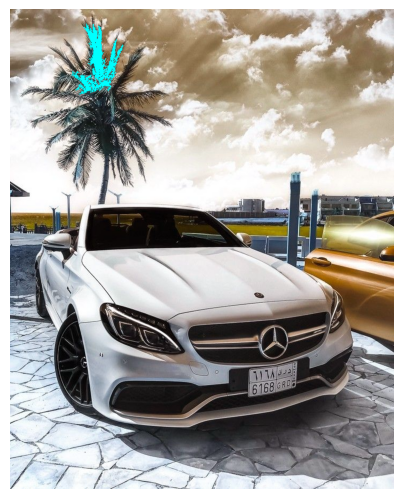

In [39]:
img = cv2.imread(filename)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

copyimg = img.copy()
h, w = copyimg.shape[:2]
mask = np.zeros([h + 2, w + 2], np.uint8)

# нужно задать координаты точек - центров заливки. Без этого работать не будет!

cv2.floodFill(copyimg, mask, (165,60), (0, 255, 255), (50, 20, 50), (50, 50 ,30), cv2.FLOODFILL_FIXED_RANGE)

fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(copyimg)
plt.savefig("merin_test_1.jpg", dpi=300)

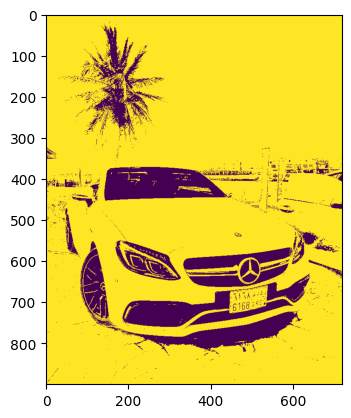

In [40]:
image = cv2.imread(filename)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

lower_bound = 50
upper_bound = 50

(thresh, BnW_image) = cv2.threshold(gray_image, lower_bound, upper_bound, cv2.THRESH_BINARY)
im = PIL.Image.fromarray(BnW_image)
im.save("tmerin_test.jpg")
plt.imshow(im)

In [41]:
# здесь представлен пример формирования шума на сером изображении, пример на
# цветном будет ниже

img = cv2.imread('merin.jpg')
img_gray = img[:,:,1]
noise = np.random.normal(0, 50, img_gray.shape)
img_noised = img_gray + noise
img_noised = np.clip(img_noised, 0, 255).astype(np.uint8)

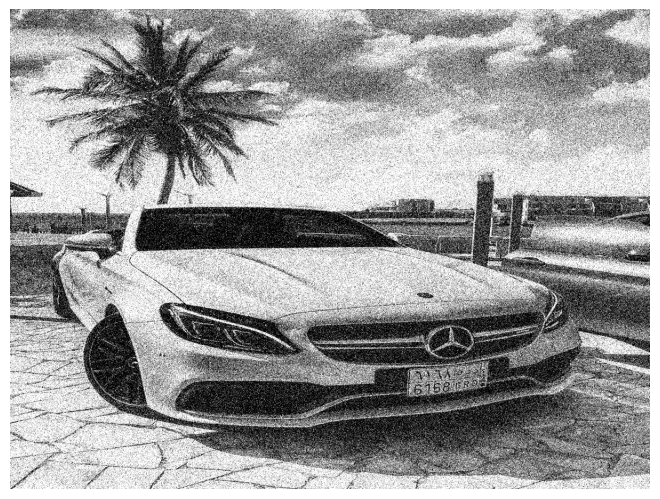

In [42]:
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(img_noised, cmap=plt.cm.gray, aspect='auto')
plt.savefig("merin_gauss_noise_test.jpg", dpi=300)

In [43]:
x = np.arange(0, 360, 1)
y = np.sin(np.deg2rad(x))

noise_sample = np.random.default_rng().uniform(0.2*min(y), 0.3*max(y), int(0.03*len(y)))
zeros = np.zeros(len(y) - len(noise_sample))
noise = np.concatenate([noise_sample, zeros])
np.random.shuffle(noise)
y_noised = y + noise

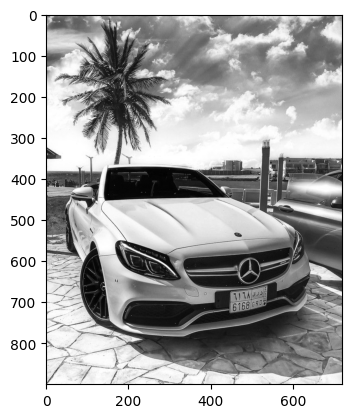

In [44]:
image = cv2.imread(filename)

h, w = image.shape[:2]

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

s = 300  # количество точек - шума

noise_sample = np.random.default_rng().uniform(low=200, high=250, size=s)

rs1 = np.random.randint(0,gray.size/h-1,s)
rs2 = np.random.randint(0,gray.size/w-1,s)

j = 0

# добавляем шум
for i in noise_sample:
    gray[rs2[j]][rs1[j]] += i
    j += 1

plt.imshow(gray, cmap=plt.cm.gray, aspect='equal')

In [45]:
img_size = img_gray.size
noise_percentage = 0.1
noise_size = int(noise_percentage*img_size)

random_indices = np.random.choice(img_size, noise_size)
img_noised = img_gray.copy()
noise = np.random.choice([img_gray.min(), img_gray.max()], noise_size)
img_noised.flat[random_indices] = noise

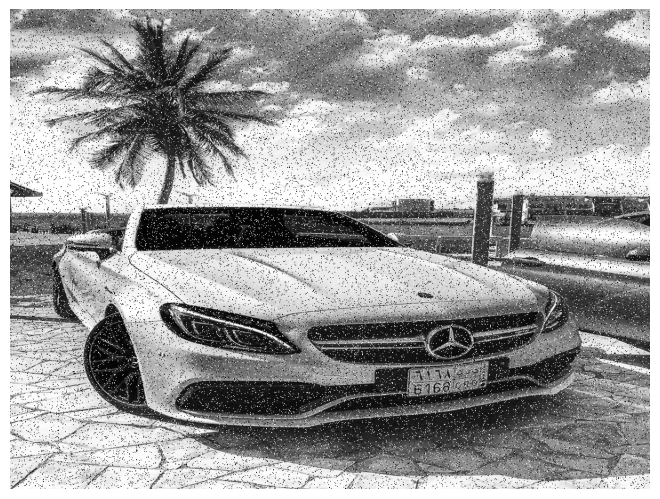

In [46]:
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(img_noised, cmap=plt.cm.gray, aspect='auto')
plt.savefig("merin_saltnpepper_test.jpg", dpi=300)

In [47]:
# Генерация исходного сигнала-примера
x = np.arange(0, 100, 2)
y = 0.3 * x + 0.6

# Генерация шума
y_size = len(y)
noise_percentage = 0.2
noise_size = int(noise_percentage * y_size)
random_indices = np.random.choice(y_size, noise_size)
y_noised = y.copy()
y_noised[random_indices] = np.rint(y_noised[random_indices])

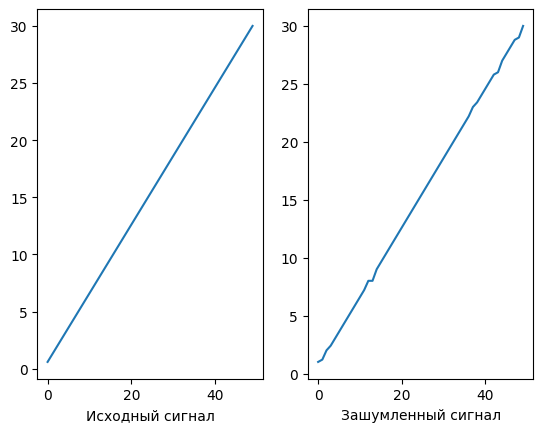

In [48]:
plt.subplot(121)
plt.plot(y)
plt.xlabel("Исходный сигнал")
plt.subplot(122)
plt.plot(y_noised)
plt.xlabel("Зашумленный сигнал")
plt.show()

In [49]:
img = cv2.imread('merin.jpg')
dst = cv2.fastNlMeansDenoisingColored(img, None, 25)

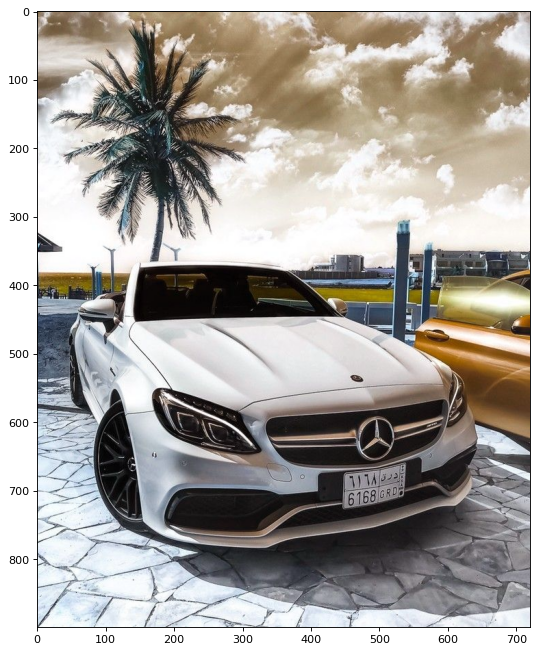

In [50]:
plt.figure(figsize=(14, 10), dpi=80)
plt.imshow(img)

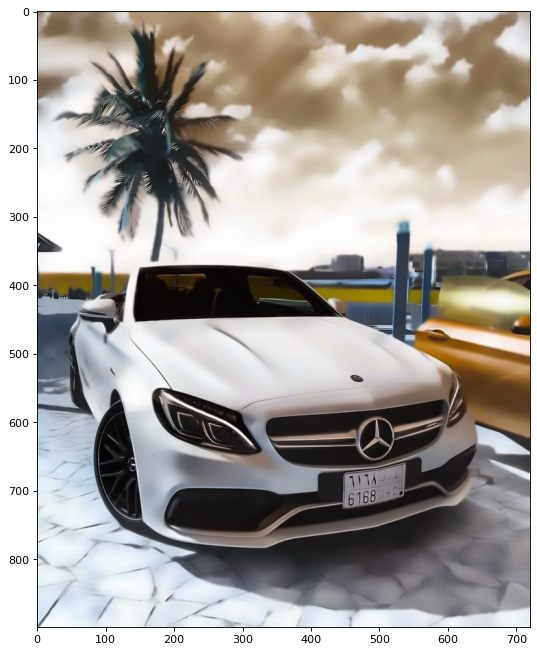

In [51]:
plt.figure(figsize=(14, 10), dpi=80)
plt.imshow(dst)

<Figure size 1200x1200 with 0 Axes>

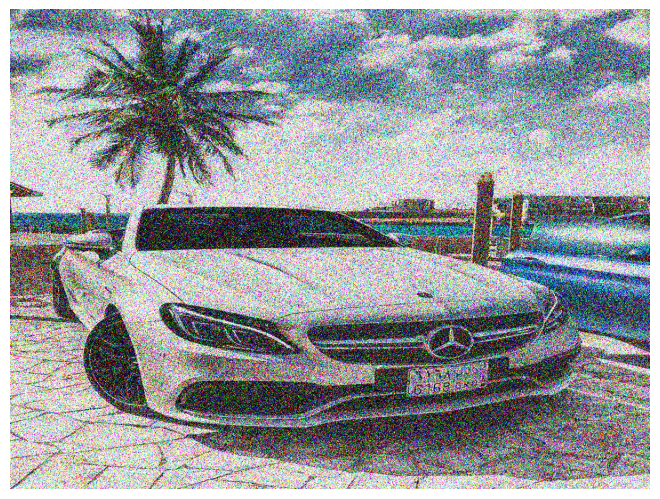

In [52]:
# добавляем шумы и сохраняем

img = cv2.imread("merin.jpg")[...,::-1] / 255.0
noise = np.random.normal(loc=0, scale=1, size=img.shape)
noisy = np.clip((img + noise * 0.2), 0,1)
noisy2 = np.clip((img + noise * 0.4), 0,1)

plt.figure(figsize=(12, 12))
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(noisy2, aspect='auto')
plt.savefig("merin_shum.jpg", dpi=300)

In [53]:
img = cv2.imread('merin_shum.jpg')
dst = cv2.fastNlMeansDenoisingColored(img, None, 15, 10, 7, 21)

<Figure size 1200x1200 with 0 Axes>

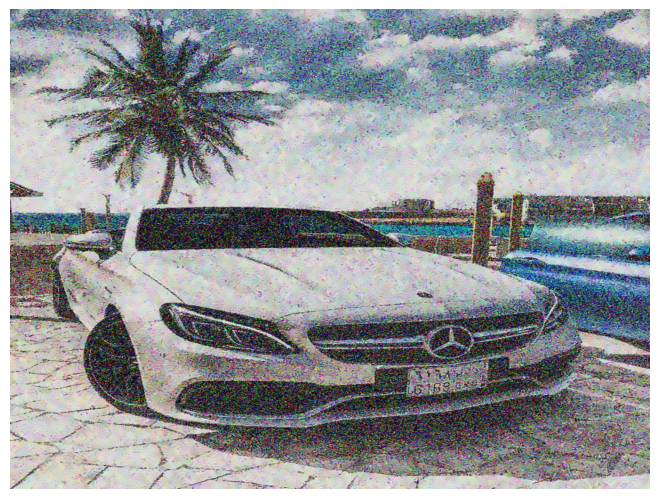

In [54]:
plt.figure(figsize=(12, 12))
fig = plt.figure(frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(dst[...,::-1] / 255.0, aspect='auto')
plt.savefig("denoised_merin.jpg", dpi=300)

In [55]:
cap = cv2.VideoCapture('1477869_Nature_Animal_3840x2160.mp4')
img = [cap.read()[1] for i in range(5)]

gray = [cv2.cvtColor(i, cv2.COLOR_BGR2GRAY) for i in img]
gray = [np.float64(i) for i in gray]

noise = np.random.randn(*gray[1].shape) * 25
noisy = [i + noise for i in gray]
noisy = [np.uint8(np.clip(i, 0, 255)) for i in noisy]

In [56]:
dst = cv2.fastNlMeansDenoisingMulti(noisy, 2, 5, None, 20, 7, 35)

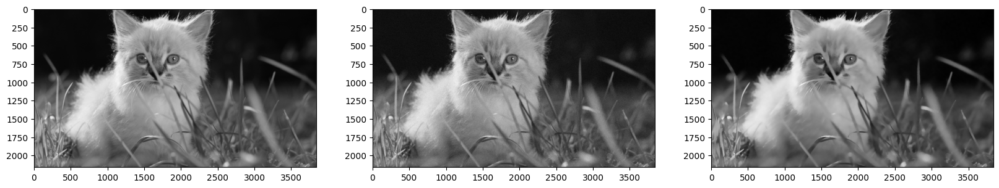

In [57]:
# исходный кадр, зашумленный, с удаленным шумом
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(gray[2],'gray')
plt.subplot(132), plt.imshow(noisy[2],'gray')
plt.subplot(133), plt.imshow(dst,'gray')
plt.show()

In [58]:
import cv2
my_photo = cv2.imread('merin.jpg')
median_image  = cv2.medianBlur(my_photo,3)
cv2.imshow('MyPhoto', median_image )
cv2.waitKey(0)
cv2.destroyAllWindows()

In [59]:
import cv2
import numpy as np
my_photo = cv2.imread('merin.jpg')
kernel = np.array([[1,1,0], [0,1,1], [1,0,1]])
im = cv2.filter2D(my_photo, -1, kernel)
cv2.imshow('car', im )
cv2.waitKey(0)
cv2.destroyAllWindows()

Лабораторная работа №1.
Использования трех фильтров на разных изображенниях
1. Фильтр Собеля.
2. Медианный фильтр
3. Фильтры opening и tophat


ФИЛЬТР СОБЕЛЯ.

Фильтр Собеля нужен для поиска границ на картинках — он хорошо видит, где заканчивается один объект и начинается другой. Главное его преимущество в том, что он работает быстро и при этом неплохо справляется с мелкими шумами на изображении. Он не только находит границы, но и показывает, в какую сторону они направлены — вертикально или горизонтально. Это простой и эффективный способ подготовить изображение для дальнейшего анализа в задачах компьютерного зрения.

In [60]:
# Фильтр на превой фотографии
import cv2
import numpy as np
my_photo = cv2.imread('merin.jpg',cv2.IMREAD_GRAYSCALE)
kernel = np.array([[-1,0,1], [-2,0,2], [-1,0,1]])
im = cv2.filter2D(my_photo, -1, kernel)
cv2_imshow(im)

In [62]:
output_path = os.path.join("merin_filterSobel.png")
cv2.imwrite(output_path, im)

True

Медианный фильтр.

Медианный фильтр обычно используется для уменьшения шума или «сглаживания» изображения. Фильтр работает с матрицами различного размера, но в отличие от матрицы свёртки, размер матрицы влияет только на количество рассматриваемых пикселей.

Алгоритм медианного фильтра следующий:

Для текущего пикселя, пиксели, которые «попадают» в матрицу, сортируются, и выбирается средние значение из отсортированного массива. Это значение и является выходным для текущего пикселя.

In [63]:

# Загружаем изображение
image = cv2.imread('merin.jpg', cv2.IMREAD_GRAYSCALE)  # или цветное

# Применяем медианный фильтр
# Параметр  - размер окна (nxn)
filtered = cv2.medianBlur(image, 7)

# Показать результат
cv2_imshow(filtered)

In [64]:
output_path = os.path.join("merin_filterMadian.png")
cv2.imwrite(output_path, filtered)

True

ФИЛЬТРЫ OPENING И TOPHAT

Opening — операция, которая включает два шага: 

1. Эрозия — удаляет небольшие объекты или детали с переднего плана (белые регионы), сужая границы объектов.

2. Расширение — восстанавливает размер оставшихся объектов. Однако, поскольку меньшие объекты были полностью эродированы на первом шаге, они не восстанавливаются, эффективно удаляясь из изображения.

Применение: Opening полезен для удаления шума или небольших объектов, которые не связаны с основными объектами в изображении. Например, если на изображении есть небольшие шумы или точки вокруг большого объекта, операция Opening удаляет мелкие шумы, сохраняя форму объекта. 

Tophat — операция, которая используется для усиления особенностей изображения, таких как небольшие объекты или яркие детали на тёмном фоне. 

In [ ]:
#1 Добавляем шум к фотографии мерина и избавляемся от него с помощью фильтра opening

img = cv2.imread("merin.jpg",cv2.IMREAD_GRAYSCALE)/255.0
noise = np.random.normal(loc=0, scale=1, size=img.shape)
noisy = np.clip((img + noise * 0.2), 0,1)
noisy2 = np.clip((img + noise * 0.4), 0,1)

cv2.imwrite("merin_mg.jpg", noisy)
cv2_imshow(img)
cv2_imshow(noisy)
kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2_imshow(opening)




In [ ]:
#2 Добавляем шум к фотографии car и смотрим применение Top Hat
img = cv2.imread("merin.jpg",cv2.IMREAD_GRAYSCALE)/255.0
noise = np.random.normal(loc=0, scale=1, size=img.shape)
noisy = np.clip((img + noise * 0.2), 0,1)
noisy2 = np.clip((img + noise * 0.4), 0,1)

cv2.imwrite("merin_tophat.jpg", noisy)
cv2_imshow(img)
cv2_imshow(noisy)
kernel = np.ones((9,9),np.uint8)
tophat = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)
cv2_imshow(tophat)